# Reproduce AIMS4PT Cpx Figures

This notebook reproduces the paper and supplementary figures for SHAP interpretation, OOD diagnostics, TAS-OOD checks, result comparisons, and regression-slope diagnostics.


In [1]:
from pathlib import Path
import sys

def _find_project_root(start=None):
    """Find the project root by walking upward from the current directory."""
    path = Path.cwd() if start is None else Path(start).resolve()
    for candidate in (path, *path.parents):
        if (candidate / "pyproject.toml").exists():
            return candidate
    raise FileNotFoundError("Could not find pyproject.toml above the current directory.")

PROJECT_ROOT = _find_project_root()
PAPER_DIR = PROJECT_ROOT / "paper"
CACHE_DIR = PAPER_DIR / ".cache"
IMAGES_DIR = PAPER_DIR / ".images"
DATA_DIR = PAPER_DIR / "data"
for _dir in (CACHE_DIR, IMAGES_DIR, DATA_DIR):
    _dir.mkdir(parents=True, exist_ok=True)

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np

import os
import time
import importlib
import matplotlib.pyplot as plt
from aims4pt.model_tools.model_registry import  get_models_initial_pools, ALL_MODELS_MODULES
for module in ALL_MODELS_MODULES:
    importlib.import_module(module)



# Independent Experimental Dataset 
Apply cpx oxide-total screening, cpx stoichiometric screening, and Fe-Mg Kd equilibrium filtering.

In [2]:
unseen_experiments_path = os.path.join(DATA_DIR, "independent_data_raw.xlsx")

unseen_experiments_df = pd.read_excel(unseen_experiments_path)

#col names for unseen_experiments_df
cpx_names = ['SiO2_cpx', 'TiO2_cpx', 'Al2O3_cpx',
       'Fe2O3_cpx', 'Cr2O3_cpx', 'FeO_cpx', 'MnO_cpx', 'MgO_cpx', 'NiO_cpx',
       'CoO_cpx', 'CaO_cpx', 'Na2O_cpx', 'K2O_cpx', 'P2O5_cpx',]
liq_names = ['SiO2_liq', 'TiO2_liq', 'Al2O3_liq',
       'Fe2O3_liq', 'Cr2O3_liq', 'FeO_liq', 'MnO_liq', 'MgO_liq', 'NiO_liq',
       'CoO_liq', 'CaO_liq', 'Na2O_liq', 'K2O_liq', 'P2O5_liq',]
P_col = 'P (kbar)'
T_col = 'T (C)'


## Cleaning and equilibrium filtering



In [3]:
print("Before cleaning, unseen_experiments_df shape:", unseen_experiments_df.shape)
cpx_total = unseen_experiments_df[cpx_names].sum(axis=1)
unseen_experiments_df = unseen_experiments_df[(cpx_total>98)&(cpx_total<102)].reset_index(drop=True)
print("After total, unseen_experiments_df shape:", unseen_experiments_df.shape)
from aims4pt.data_tools.compositions import cpx_calculation
cpx_params = cpx_calculation(unseen_experiments_df[cpx_names])
MdivT= cpx_params["(Ca+Fe+Mg)/Si"]
unseen_experiments_df = unseen_experiments_df[(MdivT>0.9)&(MdivT<1.1)].reset_index(drop=True)
print("After cpx MdivT, unseen_experiments_df shape:", unseen_experiments_df.shape)
# kd filter


from aims4pt.data_tools.equilibrium import kdEquilibrium_test
mask, kd_values = kdEquilibrium_test(
    unseen_experiments_df[cpx_names],
    unseen_experiments_df[liq_names],
    kd = 0.28,
    error = 0.08,
    mode='Fe-Mg',)
unseen_experiments_df = unseen_experiments_df[mask].reset_index(drop=True)
print("After kd filter, unseen_experiments_df shape:", unseen_experiments_df.shape)
liq_total = unseen_experiments_df[liq_names].sum(axis=1)
liq_total.describe()

Before cleaning, unseen_experiments_df shape: (517, 36)
After total, unseen_experiments_df shape: (497, 36)
After cpx MdivT, unseen_experiments_df shape: (441, 36)
After kd filter, unseen_experiments_df shape: (293, 36)


count    293.000000
mean      98.324335
std        2.691512
min       86.971390
25%       97.802000
50%       99.813648
75%      100.000000
max      100.660000
dtype: float64

In [4]:

cpx_unseen = unseen_experiments_df[cpx_names].copy()
liq_unseen = unseen_experiments_df[liq_names].copy()
meta_unseen = unseen_experiments_df[[P_col, T_col]].copy()
# stratified split
from sklearn.model_selection import StratifiedShuffleSplit

sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
P_values = unseen_experiments_df[P_col]
target_bin_size = 50
num_bins = max(2, min(10, len(P_values) // target_bin_size))
P_binned = pd.qcut(P_values, q=num_bins, labels=False, duplicates="drop")
(strat_train_idx, strat_test_idx), = sss.split(unseen_experiments_df, P_binned)
training_unseen_id = unseen_experiments_df.iloc[strat_train_idx].index
testing_unseen_id = unseen_experiments_df.iloc[strat_test_idx].index

#random split
# from sklearn.model_selection import train_test_split
# training_unseen_id, testing_unseen_id = train_test_split(
#     unseen_experiments_df.index,
#     test_size=0.2,
#     random_state=42,
#     )


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_func(


T range:  700.0  -  1350.0
P range:  0.001  -  30.0


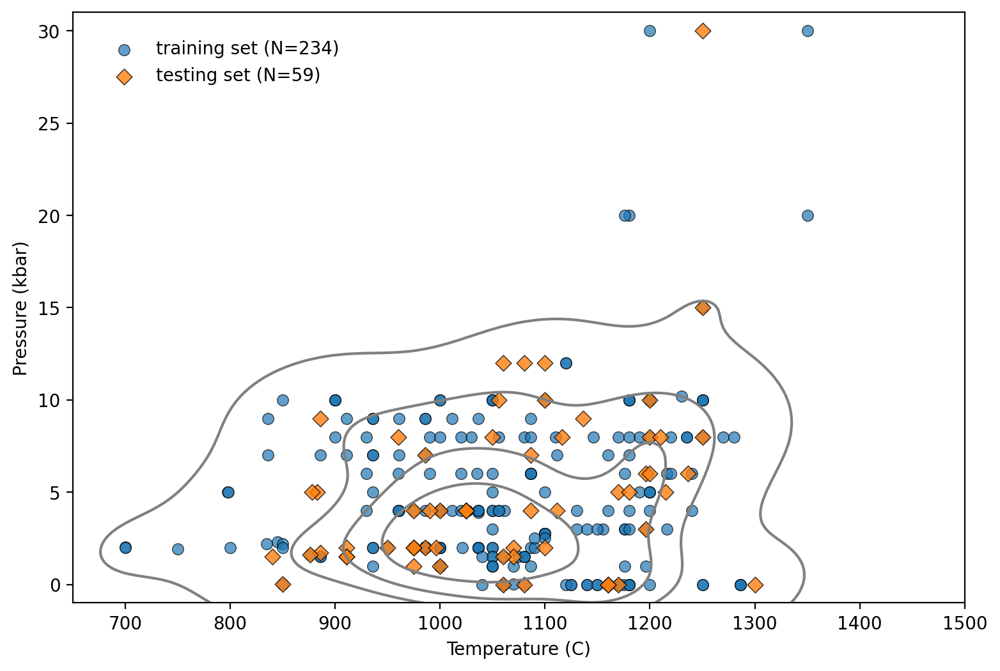

In [5]:
# P-T scatter plot for unseen test set
import seaborn as sns
fig, ax = plt.subplots(figsize=(9, 6), dpi=200)
# training set
ax.scatter(meta_unseen.loc[training_unseen_id][T_col], meta_unseen.loc[training_unseen_id][P_col], 
           alpha=0.7, label=f'training set (N={len(training_unseen_id)})', marker='o', s =40, edgecolors='k', linewidths=0.5)
sns.kdeplot(
    data=meta_unseen,
    x=T_col,
    y=P_col,
    levels=5,
    linewidth = 0.8,
    color = "grey"
)
# testing set
ax.scatter(meta_unseen.loc[testing_unseen_id][T_col], meta_unseen.loc[testing_unseen_id][P_col], 
           alpha=0.8, label=f'testing set (N={len(testing_unseen_id)})', marker='D', s= 40, edgecolors='k', linewidths=0.5)
# sns.kdeplot( 
#     data=meta_unseen,
#     x=T_col,
#     y=P_col,
#     levels=5,
#     color='red',)
ax.set_xlabel("Temperature (C)")
ax.set_ylabel("Pressure (kbar)")
ax.set_xlim(650,1500)
ax.set_ylim(-1, 31)
# in axes legend upper left
ax_tp = ax.transAxes
ax.legend(loc = 'upper left', frameon=False,
          fontsize=10,         bbox_to_anchor=(0.02, 0.98),          # Upper-left inside the axes.
        bbox_transform=ax_tp  )

# print p t max min
print("T range: ", meta_unseen[T_col].min(), " - ", meta_unseen[T_col].max())
print("P range: ", meta_unseen[P_col].min(), " - ", meta_unseen[P_col].max())


## Comparison with GEORO

In [6]:
run_compare_natural_exp_dataset = False
if run_compare_natural_exp_dataset:
    georoc_df_raw=pd.read_csv(os.path.join(DATA_DIR, "GEOROC_cpx.csv"))

    xy_pairs = [("SiO2", "TiO2"), ("SiO2", "Al2O3"), ("SiO2", "FeO"),
                ("SiO2", "MgO"), ("SiO2", "MnO"), ("SiO2", "CaO"),
                ("SiO2", "Na2O"), ("SiO2", "K2O")]
    georoc_df = georoc_df_raw.rename(columns = {
        "SIO2(WT%)":"SiO2_cpx",
        "TIO2(WT%)":"TiO2_cpx",
        "AL2O3(WT%)":"Al2O3_cpx",
        "FEO(WT%)":"FeO_cpx",
        "MNO(WT%)":"MnO_cpx",
        "MGO(WT%)":"MgO_cpx",
        "CAO(WT%)":"CaO_cpx",
        "NA2O(WT%)":"Na2O_cpx",
        "K2O(WT%)":"K2O_cpx",
        
    })

    interested_cpx_features = ["SiO2_cpx", "TiO2_cpx", "Al2O3_cpx",
    "FeO_cpx", "MnO_cpx", "MgO_cpx", "CaO_cpx",
        "Na2O_cpx", "K2O_cpx"]

    for ele in interested_cpx_features:
        georoc_df[ele] = pd.to_numeric(georoc_df[ele], errors='coerce')

    from aims4pt.visualization.composition_plot import compare_natural_exp_dataset
    compare_natural_exp_dataset(
        georoc_df[interested_cpx_features],
        unseen_experiments_df[interested_cpx_features],
        xy_pairs,
    )

# Initial all thermobarometry models

In [7]:
P_model_pool = get_models_initial_pools("P", "both" , False) # get all P models including cpx_only and cpx_liq
P_model_names = list(model.model_name for model in P_model_pool)
T_model_pool = get_models_initial_pools("T", "both" , False) # get all T models including cpx_only and cpx_liq
T_model_names = list(model.model_name for model in T_model_pool)


[Skip] Error initializing model Brugman_Till_19: Brugman_Till_19 only supports temperature (T) calculations, not pressure (P) calculations.


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.7.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator OneClassSVM from version 1.7.2 when using ver

[Skip] Error initializing model Brugman_Till_19: Brugman_Till_19 only supports temperature (T) calculations, not pressure (P) calculations.


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.7.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator OneClassSVM from version 1.7.2 when using ver

[skipped] Error initializing model <class 'aims4pt.model_tools.Neave_Putirka_17.Neave_Putirka_17'> with T: Pu08_eq33_T, P: eq1_P - Neave_Putirka_17 only supports pressure (P) calculations, not temperature (T) calculations.


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.7.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator OneClassSVM from version 1.7.2 when using ver

In [8]:
P_model_dict = {model.model_name: model for model in P_model_pool}
T_model_dict = {model.model_name: model for model in T_model_pool}

In [9]:
P_model_dict

{'Putirka, 2008 eq32d_T; eq32a_P (cpx_only)': 
         ModelManager: Putirka_08
         Model name: Putirka, 2008 eq32d_T; eq32a_P (cpx_only)
         interested parameter: P; cpx-only
         require_water: False
         uncertainty: 3.1 kbar
         comment: None
         ,
 'Putirka, 2008 eq32d_T; eq32b_P (cpx_only)': 
         ModelManager: Putirka_08
         Model name: Putirka, 2008 eq32d_T; eq32b_P (cpx_only)
         interested parameter: P; cpx-only
         require_water: True
         uncertainty: 2.6 kbar
         comment: None
         ,
 'Petrelli et al., 2020 (cpx_only)': 
         ModelManager: Petrelli20
         Model name: Petrelli et al., 2020 (cpx_only)
         interested parameter: P; cpx-only
         require_water: False
         uncertainty: 3.2 kbar
         comment: None
         ,
 'Higgins et al., 2021 (cpx_only)': 
         ModelManager: Higgins21
         Model name: Higgins et al., 2021 (cpx_only)
         interested parameter: P; cpx-only
       

# OOD criteria diagram

C:\Users\13493\AppData\Local\Temp\ipykernel_248\3552637885.py:131: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  s = detector.score(Xc, Xl).ravel()
C:\Users\13493\AppData\Local\Temp\ipykernel_248\3552637885.py:88: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if len(cs.collections) == 0:
C:\Users\13493\AppData\Local\Temp\ipykernel_248\3552637885.py:90: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for p in cs.collections[0].get_paths():


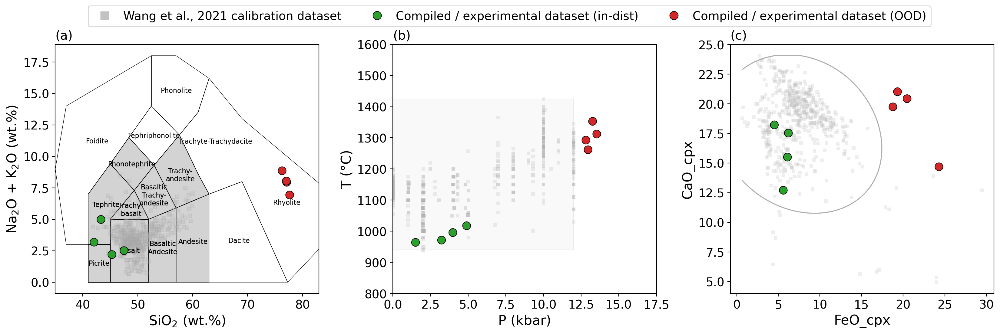

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from aims4pt.visualization.composition_plot import plot_glass_TAS_diagram
from aims4pt.utils import normalize_column_names
from aims4pt.data_tools.rocks import get_TAS_rock_types
# ============================================================
# 0) Style controls (ONE place to tune all panels)
# ============================================================
COL_REFERENCE = "0.70"
COL_ID = "C2"
COL_OOD = "C3"
COL_BOUNDARY = "0.55"

# marker style (reference vs compiled / experimental) - unified across panels
symbol_reference = "s"
symbol_new = "o"

# unified sizes & alpha (reference vs compiled / experimental)
S_REFERENCE = 18
S_NEW = 90
ALPHA_REFERENCE = 0.22
ALPHA_NEW = 1.0

# outlines (keep consistent)
EDGE_NEW = "black"
LW_NEW = 0.7

# background fill settings (TAS polygon / PT rectangle)
FILL_FACE = "0.88"
FILL_ALPHA = 0.18
FILL_EDGE = "0.65"
FILL_LW = 0.8

# ---- font controls ----
AXIS_LABEL_SIZE = 16
TICK_LABEL_SIZE = 14
TITLE_SIZE = 15
LEGEND_FONT_SIZE = 14
LEGEND_MARKER_SIZE = 10

REFERENCE_MODEL_PRIORITY = [
    ("Wang et al., 2021", "Wang et al., 2021 calibration dataset"),

]

TP_T_COL = "T_C"
TP_P_COL = "P_kbar"

# ============================================================
# 1) Helpers
# ============================================================
def _numeric_cols(df: pd.DataFrame):
    return [c for c in df.columns if pd.api.types.is_numeric_dtype(df[c])]


def _base_row(df: pd.DataFrame, cols, how="median") -> pd.DataFrame:
    sub = df[cols]
    if how == "mean":
        s = sub.mean(numeric_only=True)
    else:
        s = sub.median(numeric_only=True)
    s = s.reindex(cols)
    return s.to_frame().T


def _is_ood_bool(model, X_cpx, X_liq=None):
    """
    Return boolean mask (n,) from model.OOD_detector.is_ood(...)
    Accepts scalar bool too.
    """
    out = model.OOD_detector.is_ood(X_cpx, X_liq)
    if isinstance(out, (bool, np.bool_)):
        return np.array([bool(out)])
    out = np.asarray(out).astype(bool)
    return out


def _extract_zero_contour_paths(xx, yy, Z, level=0.0):
    """Extract contour paths for Z=level using matplotlib's contour."""
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cs = ax.contour(xx, yy, Z, levels=[level])
    plt.close(fig)

    paths = []
    if len(cs.collections) == 0:
        return paths
    for p in cs.collections[0].get_paths():
        v = p.vertices
        paths.append((v[:, 0].copy(), v[:, 1].copy()))
    return paths


def _eval_detector_on_slice(
    detector,
    *,
    base_cpx_row: pd.DataFrame | None,
    base_liq_row: pd.DataFrame | None,
    x_feat: str,
    y_feat: str,
    xx: np.ndarray,
    yy: np.ndarray,
):
    """
    Build full input matrices by repeating base row and overwriting x_feat/y_feat,
    then evaluate detector.score() over the grid.
    """
    n = xx.size
    Xc = None
    if base_cpx_row is not None:
        Xc = pd.concat([base_cpx_row] * n, ignore_index=True)
    Xl = None
    if base_liq_row is not None:
        Xl = pd.concat([base_liq_row] * n, ignore_index=True)

    # overwrite in whichever phase contains the features
    if Xc is not None and x_feat in Xc.columns:
        Xc[x_feat] = xx.ravel()
    if Xc is not None and y_feat in Xc.columns:
        Xc[y_feat] = yy.ravel()
    if Xl is not None and x_feat in Xl.columns:
        Xl[x_feat] = xx.ravel()
    if Xl is not None and y_feat in Xl.columns:
        Xl[y_feat] = yy.ravel()

    if Xl is None:
        s = detector.score(Xc, X_liq=None).ravel()
    else:
        s = detector.score(Xc, Xl).ravel()

    return s.reshape(xx.shape)


# ============================================================
def _match_reference_model(model_dict, family_name, preferred_suffix="(cpx_only)"):
    preferred = [name for name in model_dict if family_name in name and preferred_suffix in name]
    if preferred:
        return model_dict[preferred[0]]

    matches = [name for name in model_dict if family_name in name]
    if matches:
        return model_dict[matches[0]]
    return None


def resolve_unified_reference_models(P_model_dict, T_model_dict):
    # Select one broad-coverage representative reference calibration dataset for BOTH TAS and P-T panels.
    # Prefer Ágreda-López et al. (2024); fall back to Jorgenson et al. (2022) if needed.
    for family_name, label in REFERENCE_MODEL_PRIORITY:
        P_model = _match_reference_model(P_model_dict, family_name)
        T_model = _match_reference_model(T_model_dict, family_name)
        if P_model is not None and T_model is not None:
            return P_model, T_model, label

    available_p = sorted(P_model_dict.keys())
    available_t = sorted(T_model_dict.keys())
    raise KeyError(
        "Could not resolve a unified reference model from the current pipeline. "
        f"Available P models: {available_p}; Available T models: {available_t}"
    )


def build_reference_pt_dataset(P_model, T_model, tp_t_col, tp_p_col):
    reference_pt = getattr(P_model, "X_cpx_training", None)
    if reference_pt is None or len(reference_pt) == 0:
        raise ValueError("Reference P model has no X_cpx_training calibration dataset.")
    reference_pt = reference_pt.copy()

    reference_t = getattr(T_model, "X_cpx_training", None)
    if reference_t is None or len(reference_t) == 0:
        raise ValueError("Reference T model has no X_cpx_training calibration dataset.")
    reference_t = reference_t.copy()

    if "Sample_ID" in reference_pt.columns and "Sample_ID" in reference_t.columns:
        reference_t_lookup = (
            reference_t[["Sample_ID", tp_t_col]]
            .dropna(subset=[tp_t_col])
            .drop_duplicates(subset="Sample_ID")
        )
        reference_pt = reference_pt.drop(columns=[tp_t_col], errors="ignore").merge(
            reference_t_lookup,
            on="Sample_ID",
            how="left",
        )
    elif tp_t_col not in reference_pt.columns and tp_t_col in reference_t.columns and len(reference_pt) == len(reference_t):
        reference_pt = reference_pt.copy()
        reference_pt[tp_t_col] = reference_t[tp_t_col].to_numpy()

    missing_cols = [col for col in (tp_p_col, tp_t_col) if col not in reference_pt.columns]
    if missing_cols:
        raise KeyError(f"Reference P-T dataset is missing required columns: {missing_cols}")

    return reference_pt


def get_reference_liq_dataset(P_model, T_model):
    reference_liq = getattr(P_model, "X_liq_training", None)
    if reference_liq is None:
        reference_liq = getattr(T_model, "X_liq_all", None)
    if reference_liq is None or len(reference_liq) == 0:
        raise ValueError("Unified reference model has no liquid calibration dataset for the TAS panel.")
    return reference_liq.copy()


# ============================================================
# 2) Panel (a): TAS comparison
# ============================================================
def panel_a_TAS(ax, X_liq_reference, reference_label, reference_model, X_liq_new=None):
    # Use the same reference calibration dataset as the TAS background so it can be switched in one place later.
    plot_glass_TAS_diagram(
        X_liq_reference,
        axes=ax,
        color=COL_REFERENCE,
        marker=symbol_reference,
        label=reference_label,
        fill=True,
        facecolor=FILL_FACE,
        edgecolor=FILL_EDGE,
        linewidth=FILL_LW,
        s=S_REFERENCE,
        alpha=ALPHA_REFERENCE,
    )

    # new samples
    if X_liq_new is not None and len(X_liq_new) > 0:
        liq_df = normalize_column_names(X_liq_new).copy()
        from aims4pt.statistic_tools.density_region_analysis import rock_type_check
        tas_types = liq_df.apply(get_TAS_rock_types, axis=1)

        tas_ok = np.array([rock_type_check(rt, reference_model.rock_types, report=False) for rt in tas_types])
        liq_df["Na2O + K2O"] = liq_df["Na2O"] + liq_df["K2O"]

        ax.scatter(
            liq_df["SiO2"].loc[tas_ok],
            liq_df["Na2O + K2O"].loc[tas_ok],
            c=COL_ID,
            s=S_NEW,
            alpha=ALPHA_NEW,
            edgecolor=EDGE_NEW,
            lw=LW_NEW,
            label="new samples (in-dist)",
            zorder=5,
            marker=symbol_new,
        )

        ax.scatter(
            liq_df["SiO2"].loc[~tas_ok],
            liq_df["Na2O + K2O"].loc[~tas_ok],
            c=COL_OOD,
            s=S_NEW,
            alpha=ALPHA_NEW,
            edgecolor=EDGE_NEW,
            lw=LW_NEW,
            label="new samples (OOD)",
            zorder=6,
            marker=symbol_new,
        )

    ax.set_title("(a)", loc="left", fontsize=TITLE_SIZE)
    ax.set_xlabel("SiO$_2$ (wt.%)", fontsize=AXIS_LABEL_SIZE)
    ax.set_ylabel("Na$_2$O + K$_2$O (wt.%)", fontsize=AXIS_LABEL_SIZE)
    ax.tick_params(axis="both", labelsize=TICK_LABEL_SIZE)
    return ax


# ============================================================
# 3) Panel (b): Predicted P-T comparison
# ============================================================
def panel_b_PT(ax, X_reference, reference_label, X_cpx_new, X_liq_new, P_model, T_model):
    """
    - Reference cloud: one unified reference calibration dataset.
    - Comparison background: subtle min-max rectangle from the same reference dataset.
    - New input: predict P and T using model.predict(X_cpx_new, X_liq_new), then color by range check.
    """
    if TP_P_COL not in X_reference.columns or TP_T_COL not in X_reference.columns:
        raise KeyError(f"X_reference must contain '{TP_P_COL}' and '{TP_T_COL}' columns for panel_b_PT.")

    P_ref = X_reference[TP_P_COL].to_numpy(float)
    T_ref = X_reference[TP_T_COL].to_numpy(float)
    ref_mask = np.isfinite(P_ref) & np.isfinite(T_ref)
    P_ref = P_ref[ref_mask]
    T_ref = T_ref[ref_mask]

    ax.scatter(
        P_ref, T_ref,
        c=COL_REFERENCE,
        s=S_REFERENCE,
        alpha=ALPHA_REFERENCE,
        edgecolor="none",
        label=reference_label,
        marker=symbol_reference,
        zorder=1,
    )

    Pmin, Pmax = np.nanmin(P_ref), np.nanmax(P_ref)
    Tmin, Tmax = np.nanmin(T_ref), np.nanmax(T_ref)

    rect = Rectangle(
        (Pmin, Tmin),
        Pmax - Pmin,
        Tmax - Tmin,
        facecolor=FILL_FACE,
        edgecolor=FILL_EDGE,
        lw=FILL_LW,
        alpha=FILL_ALPHA,
        zorder=0,
    )
    ax.add_patch(rect)

    P_pred = np.asarray(P_model.predict(X_cpx_new, X_liq_new)).ravel()
    T_pred = np.asarray(T_model.predict(X_cpx_new, X_liq_new)).ravel()

    in_range = (P_pred >= Pmin) & (P_pred <= Pmax) & (T_pred >= Tmin) & (T_pred <= Tmax)
    colors = np.where(in_range, COL_ID, COL_OOD)

    ax.scatter(
        P_pred, T_pred,
        c=colors,
        s=S_NEW,
        alpha=ALPHA_NEW,
        edgecolor=EDGE_NEW,
        lw=LW_NEW,
        zorder=5,
        marker=symbol_new
    )

    ax.set_xlabel("P (kbar)", fontsize=AXIS_LABEL_SIZE)
    ax.set_ylabel("T (°C)", fontsize=AXIS_LABEL_SIZE)
    ax.set_title("(b)", loc="left", fontsize=TITLE_SIZE)
    ax.tick_params(axis="both", labelsize=TICK_LABEL_SIZE)
    ax.set_xlim(0, 17.5)
    ax.set_ylim(800, 1600)
    return ax


# ============================================================
# 4) Panel (c)/(d): Feature-space OOD slice
# ============================================================
def _panel_model_ood_slice(
    ax,
    model,
    *,
    x_axis: str,
    y_axis: str,
    base_how="median",
    n_grid=260,
    show_train=True,
    show_new=True,
    X_cpx_new=None,
    X_liq_new=None,
):
    """
    Hard-rule OOD slice plot (mixed-phase allowed):

    Rules:
    - x_axis / y_axis must be exact column names.
    - Columns ending with '_cpx' live in cpx dataframe.
    - Columns ending with '_liq' live in liq dataframe.
    - x and y can be in different phases.
    - Training/new scatter uses index-aligned pairs ONLY for training;
      new uses raw arrays as provided (consistent with your current usage).
    """
    detector = model.OOD_detector
    Xc_train = model.X_cpx_training
    Xl_train = model.X_liq_training

    def _which_phase(col: str) -> str:
        if col.endswith("_cpx"):
            return "cpx"
        if col.endswith("_liq"):
            return "liq"
        raise ValueError(f"Column '{col}' must end with '_cpx' or '_liq'.")

    x_phase = _which_phase(x_axis)
    y_phase = _which_phase(y_axis)

    x_train_df = Xc_train if x_phase == "cpx" else Xl_train
    y_train_df = Xc_train if y_phase == "cpx" else Xl_train

    if x_train_df is None:
        raise AttributeError(f"Model has no training dataframe for x_axis phase: {x_phase}")
    if y_train_df is None:
        raise AttributeError(f"Model has no training dataframe for y_axis phase: {y_phase}")

    column_aliases = {
        "FeOt_cpx": ("FeO_cpx",),
        "FeO_cpx": ("FeOt_cpx",),
        "FeOt_liq": ("FeO_liq",),
        "FeO_liq": ("FeOt_liq",),
    }

    def _resolve_existing_column(df: pd.DataFrame, col: str, *, role: str) -> str:
        # Some models use FeOt while the compiled input uses FeO; resolve aliases per dataframe.
        for candidate in (col, *column_aliases.get(col, ())):
            if candidate in df.columns:
                return candidate
        raise KeyError(
            f"Could not find column '{col}' or aliases {column_aliases.get(col, ())} "
            f"in {role}. Available columns: {list(df.columns)}"
        )

    x_train_axis = _resolve_existing_column(x_train_df, x_axis, role=f"{x_phase} training data")
    y_train_axis = _resolve_existing_column(y_train_df, y_axis, role=f"{y_phase} training data")

    if x_phase != y_phase:
        idx = x_train_df.index.intersection(y_train_df.index)
        if len(idx) == 0:
            raise ValueError("No overlapping indices between cpx and liq training data for mixed-phase plot.")
        x_tr = x_train_df.loc[idx, x_train_axis].to_numpy(float)
        y_tr = y_train_df.loc[idx, y_train_axis].to_numpy(float)
    else:
        x_tr = x_train_df[x_train_axis].to_numpy(float)
        y_tr = y_train_df[y_train_axis].to_numpy(float)

    x_min, x_max = np.nanpercentile(x_tr, [0, 100])
    y_min, y_max = np.nanpercentile(y_tr, [0, 100])

    xx, yy = np.meshgrid(
        np.linspace(x_min, x_max, n_grid),
        np.linspace(y_min, y_max, n_grid),
    )

    base_cpx = None
    base_liq = None
    if Xc_train is not None:
        base_cpx = _base_row(Xc_train, _numeric_cols(Xc_train), how=base_how)
    if Xl_train is not None:
        base_liq = _base_row(Xl_train, _numeric_cols(Xl_train), how=base_how)

    Z = _eval_detector_on_slice(
        detector,
        base_cpx_row=base_cpx,
        base_liq_row=base_liq,
        x_feat=x_train_axis,
        y_feat=y_train_axis,
        xx=xx,
        yy=yy,
    )

    for xp, yp in _extract_zero_contour_paths(xx, yy, Z, level=0.0):
        ax.plot(xp, yp, color=COL_BOUNDARY, lw=1.2, alpha=0.7, zorder=3)

    if show_train:
        ax.scatter(
            x_tr, y_tr,
            s=S_REFERENCE,
            alpha=ALPHA_REFERENCE,
            c=COL_REFERENCE,
            edgecolor="none",
            zorder=1,
            marker=symbol_reference,
        )

    if show_new:
        x_new_df = X_cpx_new if x_phase == "cpx" else X_liq_new
        y_new_df = X_cpx_new if y_phase == "cpx" else X_liq_new

        if x_new_df is None or y_new_df is None:
            ax.set_xlabel(x_axis, fontsize=AXIS_LABEL_SIZE)
            ax.set_ylabel(y_axis, fontsize=AXIS_LABEL_SIZE)
            ax.tick_params(axis="both", labelsize=TICK_LABEL_SIZE)
            return ax

        x_new_axis = _resolve_existing_column(x_new_df, x_axis, role=f"{x_phase} new data")
        y_new_axis = _resolve_existing_column(y_new_df, y_axis, role=f"{y_phase} new data")
        x_new = x_new_df[x_new_axis].to_numpy(float)
        y_new = y_new_df[y_new_axis].to_numpy(float)

        ood_mask = _is_ood_bool(model, X_cpx=X_cpx_new, X_liq=X_liq_new)
        colors = np.where(ood_mask, COL_OOD, COL_ID)

        ax.scatter(
            x_new, y_new,
            c=colors,
            s=S_NEW,
            alpha=ALPHA_NEW,
            edgecolor=EDGE_NEW,
            lw=LW_NEW,
            zorder=5,
            marker=symbol_new,
        )

    ax.set_xlabel(x_axis, fontsize=AXIS_LABEL_SIZE)
    ax.set_ylabel(y_axis, fontsize=AXIS_LABEL_SIZE)
    ax.tick_params(axis="both", labelsize=TICK_LABEL_SIZE)
    return ax


def panel_c_P_model_ood(ax, model, x_axis="CaO_cpx", y_axis="FeO_cpx", X_cpx_new=None, X_liq_new=None):
    ax = _panel_model_ood_slice(
        ax,
        model,
        x_axis=x_axis,
        y_axis=y_axis,
        X_cpx_new=X_cpx_new,
        X_liq_new=X_liq_new,
    )
    ax.set_title("(c)", loc="left", fontsize=TITLE_SIZE)
    return ax


def panel_d_T_model_ood(
    ax,
    model,
    x_axis="FeO_cpx",
    y_axis="H2O_liq",
    X_cpx_new=None,
    X_liq_new=None,
):
    ax = _panel_model_ood_slice(
        ax,
        model,
        x_axis=x_axis,
        y_axis=y_axis,
        X_cpx_new=X_cpx_new,
        X_liq_new=X_liq_new,
    )
    ax.set_title("(d)", loc="left", fontsize=TITLE_SIZE)
    return ax


# ============================================================
# 5) Example: your requested calling style
# ============================================================
def plot_four_panels_example(P_model, T_model, reference_liq_df, reference_pt_df, reference_label, sample_cpx_input, sample_liq_input):
    fig, axes = plt.subplots(1, 3, figsize=(20, 5.8), dpi=200)

    panel_a_TAS(
        ax=axes[0],
        X_liq_reference=reference_liq_df,
        reference_label=reference_label,
        reference_model=P_model,
        X_liq_new=sample_liq_input,
    )

    panel_b_PT(
        ax=axes[1],
        X_reference=reference_pt_df,
        reference_label=reference_label,
        X_cpx_new=sample_cpx_input,
        X_liq_new=sample_liq_input,
        P_model=P_model,
        T_model=T_model,
    )

    panel_c_P_model_ood(
        ax=axes[2],
        model=P_model,
        x_axis="FeO_cpx",
        y_axis="CaO_cpx",
        X_cpx_new=sample_cpx_input,
        X_liq_new=sample_liq_input,
    )

    handles = [
        plt.Line2D([0], [0], marker=symbol_reference, color='w', label=reference_label,
                   markerfacecolor=COL_REFERENCE, markersize=LEGEND_MARKER_SIZE, markeredgecolor='none', alpha=0.8),
        plt.Line2D([0], [0], marker=symbol_new, color='w', label='New samples (in-dist)',
                   markerfacecolor=COL_ID, markersize=LEGEND_MARKER_SIZE,
                   markeredgecolor=EDGE_NEW, markeredgewidth=LW_NEW),
        plt.Line2D([0], [0], marker=symbol_new, color='w', label='New samples (OOD)',
                   markerfacecolor=COL_OOD, markersize=LEGEND_MARKER_SIZE,
                   markeredgecolor=EDGE_NEW, markeredgewidth=LW_NEW),
    ]

    fig.legend(
        handles=handles,
        loc="upper center",
        bbox_to_anchor=(0.5, 0.93),
        ncol=3,
        frameon=True,
        fontsize=LEGEND_FONT_SIZE,
        handletextpad=0.6,
        borderaxespad=0.0,
        labelspacing=0.4,
    )

    plt.subplots_adjust(top=0.82, wspace=0.28)
    return fig, axes


# ============================================================
# Usage
# ============================================================
required_globals = ["P_model_dict", "T_model_dict", "cpx_unseen", "liq_unseen"]
missing = [name for name in required_globals if name not in globals()]
if missing:
    raise NameError(f"Missing required objects: {missing}. Run the setup/model-loading cells first.")

sample_cpx_input = cpx_unseen.copy()
sample_liq_input = liq_unseen.copy()

random_selected_ids = [159, 166, 279, 280, 225, 226, 227, 223]

# One unified reference calibration dataset for both TAS and P-T panels.
P_model, T_model, reference_label = resolve_unified_reference_models(P_model_dict, T_model_dict)
reference_liq_df = get_reference_liq_dataset(P_model, T_model)
reference_pt_df = build_reference_pt_dataset(P_model, T_model, TP_T_COL, TP_P_COL)

fig, axes = plot_four_panels_example(
    P_model,
    T_model,
    reference_liq_df,
    reference_pt_df,
    reference_label,
    sample_cpx_input.loc[random_selected_ids].reset_index(drop=True),
    sample_liq_input.loc[random_selected_ids].reset_index(drop=True),
)


fig.savefig(IMAGES_DIR / "OOD_filters_illustration.png", dpi=300, bbox_inches="tight")


# SHAP figures

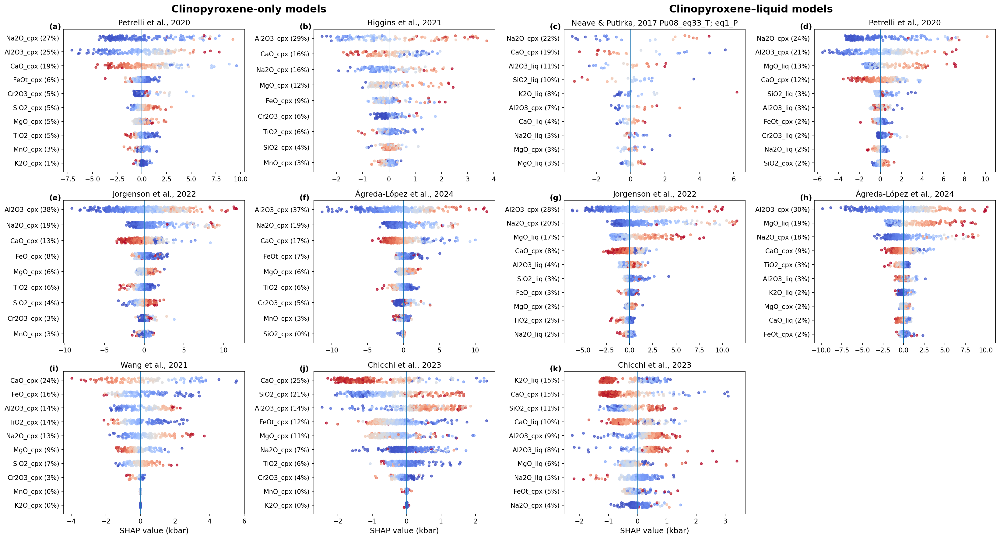

In [11]:
from paper.scripts.figure_helpers import (
    _add_panel_letter__nb03_c05 as _add_panel_letter,
    _clean_model_label__nb03_c05 as _clean_model_label,
    _format_panel_title__nb03_c05 as _format_panel_title,
    _safe_concat_cpx_liq__nb03_c05 as _safe_concat_cpx_liq,
    plot_shap_summary_cpx_only_vs_cpx_liq__nb03_c05 as plot_shap_summary_cpx_only_vs_cpx_liq,
)

import math
import string
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import StratifiedShuffleSplit

from aims4pt.visualization.mode_related_plot import (
    plot_shap_summary_dot_colored,
)


# ============================================================
# Run & save
# ============================================================
P_model_has_data = [model for model in P_model_pool if getattr(model, "X_cpx_training", None) is not None]

fig, axes = plot_shap_summary_cpx_only_vs_cpx_liq(
    P_model_has_data,
    top_n=10,
    fig_width_per_col=5.5,
    row_height=4.0,
)
fig.savefig(
    IMAGES_DIR / "fig_shap_P_v1.png",
    dpi=300
)


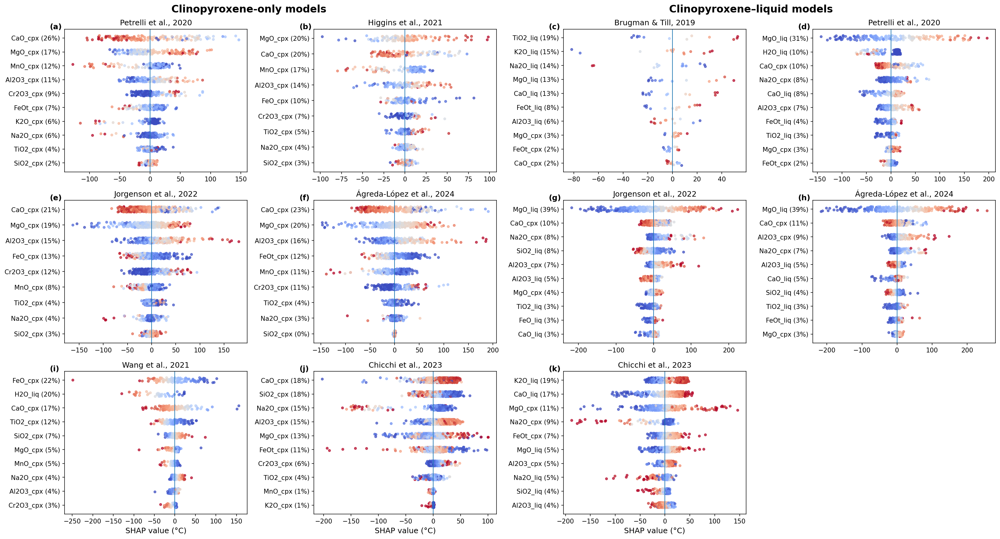

In [12]:
T_model_has_data = [model for model in T_model_pool if getattr(model, "X_cpx_training", None) is not None]

fig, axes = plot_shap_summary_cpx_only_vs_cpx_liq(
    T_model_has_data,
    top_n=10,
    fig_width_per_col=5.5,
    row_height=4.0,
)
fig.savefig(
    IMAGES_DIR / "fig_shap_T_v1.png",
    dpi=300
)

# OOD

## OOD vs deviation (pressure model)

Error importing in API mode: ImportError('On Windows, cffi mode "ANY" is only "ABI".')
Trying to import in ABI mode.
R callback write-console: Loading required package: rJava
  
R callback write-console: Loading required package: extraTrees
  
R callback write-console: Loading required package: EnvStats
  
R callback write-console: 
Attaching package: 'EnvStats'

  
R callback write-console: The following objects are masked from 'package:stats':

    predict, predict.lm

  
R callback write-console: Loading required package: PerformanceAnalytics
  
R callback write-console: Loading required package: xts
  
R callback write-console: Loading required package: zoo
  
R callback write-console: 
Attaching package: 'zoo'

  
R callback write-console: The following objects are masked from 'package:base':

    as.Date, as.Date.numeric

  
R callback write-console: 
Attaching package: 'PerformanceAnalytics'

  
R callback write-console: The following objects are masked from 'package:EnvStats':


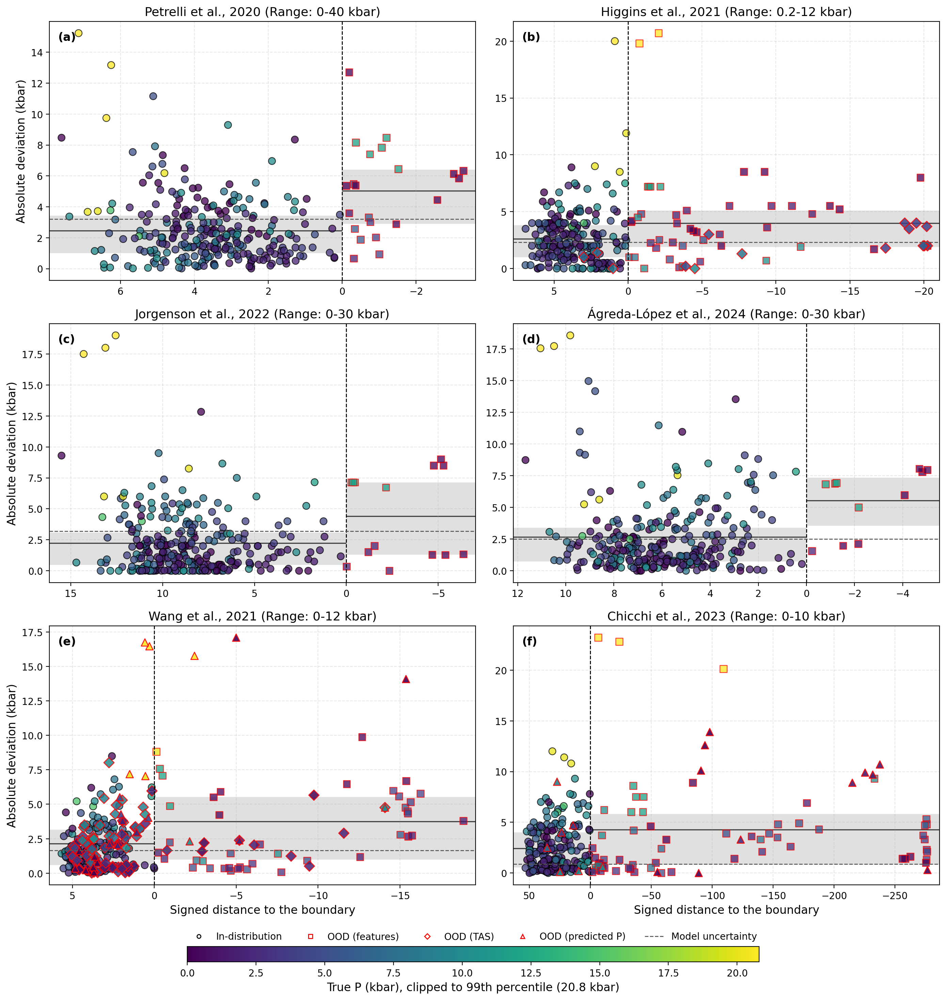

In [13]:
from paper.scripts.figure_helpers import (
    _add_panel_labels__nb03_c08 as _add_panel_labels,
    _draw_side_q1_mean_q3__nb03_c08 as _draw_side_q1_mean_q3,
    _fmt_num__nb03_c08 as _fmt_num,
    plot_ood_panels_generic__nb03_c08 as plot_ood_panels_generic,
    plot_ood_score_vs_deviation__nb03_c08 as plot_ood_score_vs_deviation,
)



test_cpx = cpx_unseen.copy()
test_liq = liq_unseen.copy()
test_meta = meta_unseen.copy()
test_meta.rename(columns={P_col: "P_kbar", T_col: "T_C"}, inplace=True)

P_cpx_only = [
    m for m in P_model_pool
    if m.cpx_only and getattr(m, "X_cpx_training", None) is not None
]
fig, axes = plot_ood_panels_generic(
    P_cpx_only,
    test_cpx,
    test_meta,
    test_liq=test_liq,
    petrological_ood_marker=True,
    T_P_ood_marker=True,
    ncols=2,
    fig_width=14,
    row_height=5.4,
    height_scale=1.08,
    cmap_name="viridis",
    norm_min=0,
    clip_to_p99=True,    
    cbar_width=0.6,
    cbar_height=0.013,
    cbar_y=0.15,
    legend_anchor_y=0.16,
    tight_bottom=0.18,
    tight_top=0.96,
)
plt.show()
fig.savefig(
    IMAGES_DIR / "fig_ood_P_cpx_only.png",
    dpi=300,
    bbox_inches="tight",
    pad_inches=0.02,
)


C:\Users\13493\AppData\Local\Temp\ipykernel_35956\2514854262.py:221: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap(cmap_name)
C:\Users\13493\AppData\Local\Temp\ipykernel_35956\2514854262.py:221: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap(cmap_name)
C:\Users\13493\AppData\Local\Temp\ipykernel_35956\2514854262.py:221: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap(cmap_name)
C:\Users\13493\AppData\Local\Temp\ipykernel_35956\25148

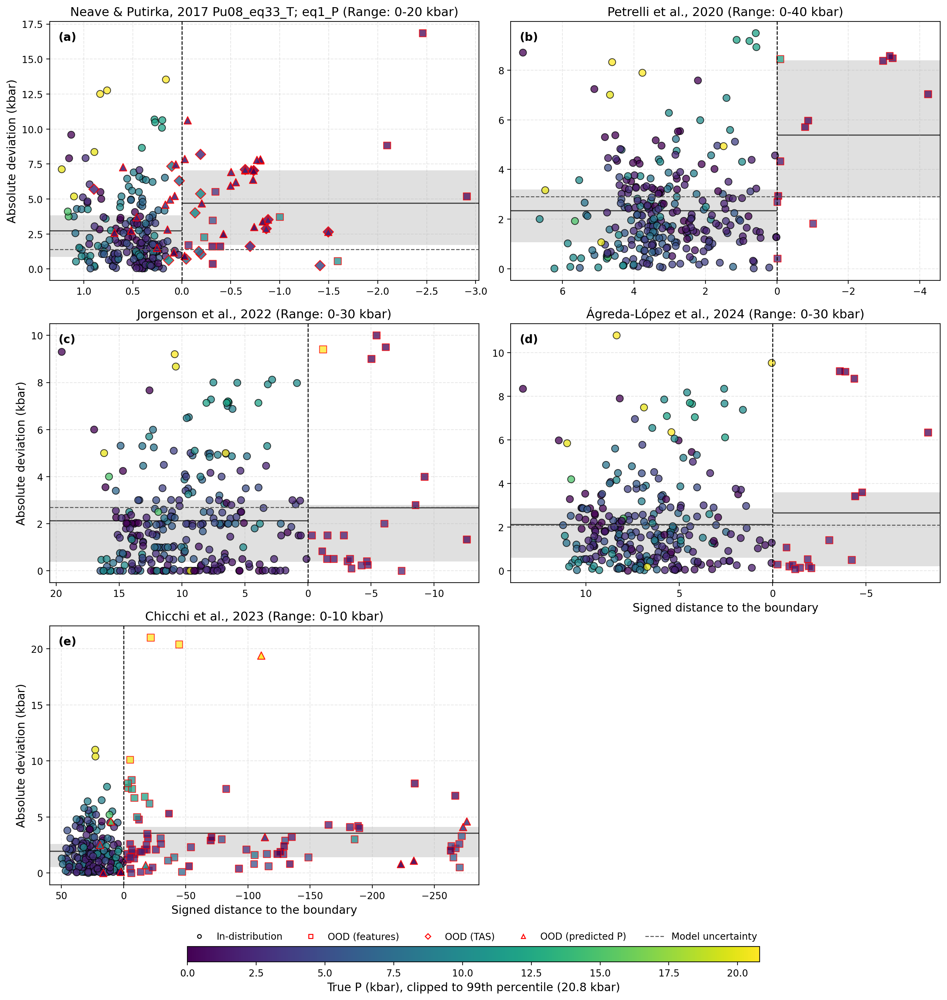

In [ ]:
P_cpx_liq = [
    m for m in P_model_pool
    if not m.cpx_only
]
fig, axes = plot_ood_panels_generic(
    P_cpx_liq,
    test_cpx,
    test_meta,
    test_liq=test_liq,
    petrological_ood_marker=True,
    T_P_ood_marker=True,
    ncols=2,
    fig_width=14,
    row_height=5.4,
    height_scale=1.08,
    cmap_name="viridis",
    norm_min=0,
    clip_to_p99=True,    
    cbar_width=0.6,
    cbar_height=0.013,
    cbar_y=0.15,
    legend_anchor_y=0.16,
    tight_bottom=0.18,
    tight_top=0.96,
)
plt.show()
fig.savefig(IMAGES_DIR / "fig_ood_P_cpx_liq.png",     dpi=300,
    bbox_inches="tight",
    pad_inches=0.02,
)

## OOD vs deviation (temperature model)

C:\Users\13493\AppData\Local\Temp\ipykernel_35956\2260967873.py:212: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap(cmap_name)
C:\Users\13493\AppData\Local\Temp\ipykernel_35956\2260967873.py:212: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap(cmap_name)
C:\Users\13493\AppData\Local\Temp\ipykernel_35956\2260967873.py:212: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap(cmap_name)
C:\Users\13493\AppData\Local\Temp\ipykernel_35956\22609

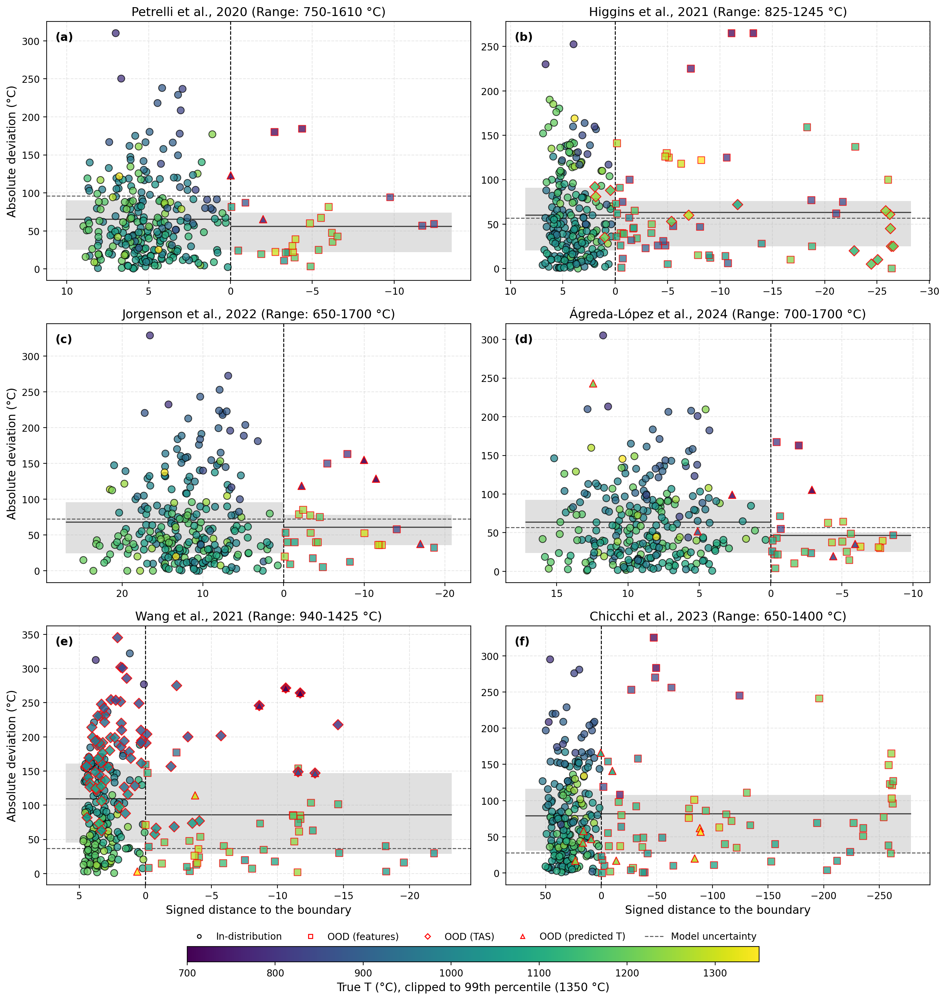

In [ ]:

# =========================
# Calling (Temperature version)
# =========================
test_cpx = cpx_unseen.copy()
test_liq = liq_unseen.copy()
test_meta = meta_unseen.copy()
test_meta.rename(columns={P_col: "P_kbar", T_col: "T_C"}, inplace=True)

T_cpx_only = [
    m for m in T_model_pool
    if m.cpx_only and getattr(m, "X_cpx_training", None) is not None
]

fig, axes = plot_ood_panels_generic(
    T_cpx_only,
    test_cpx,
    test_meta,
    test_liq=test_liq,
    petrological_ood_marker=True,
    T_P_ood_marker=True,
    ncols=2,
    fig_width=14,
    row_height=5.4,
    height_scale=1.08,
    cmap_name="viridis",
    norm_min=700,          # typical temperature range start
    clip_to_p99=False,
    cbar_width=0.6,
    cbar_height=0.013,
    cbar_y=0.15,
    legend_anchor_y=0.16,
    tight_bottom=0.18,
    tight_top=0.96,
)
plt.show()
fig.savefig(IMAGES_DIR / "fig_ood_T_cpx_only.png",    dpi=300,
    bbox_inches="tight",
    pad_inches=0.02,
)

C:\Users\13493\AppData\Local\Temp\ipykernel_35956\2260967873.py:212: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap(cmap_name)
C:\Users\13493\AppData\Local\Temp\ipykernel_35956\2260967873.py:212: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap(cmap_name)
C:\Users\13493\AppData\Local\Temp\ipykernel_35956\2260967873.py:212: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap(cmap_name)
C:\Users\13493\AppData\Local\Temp\ipykernel_35956\22609

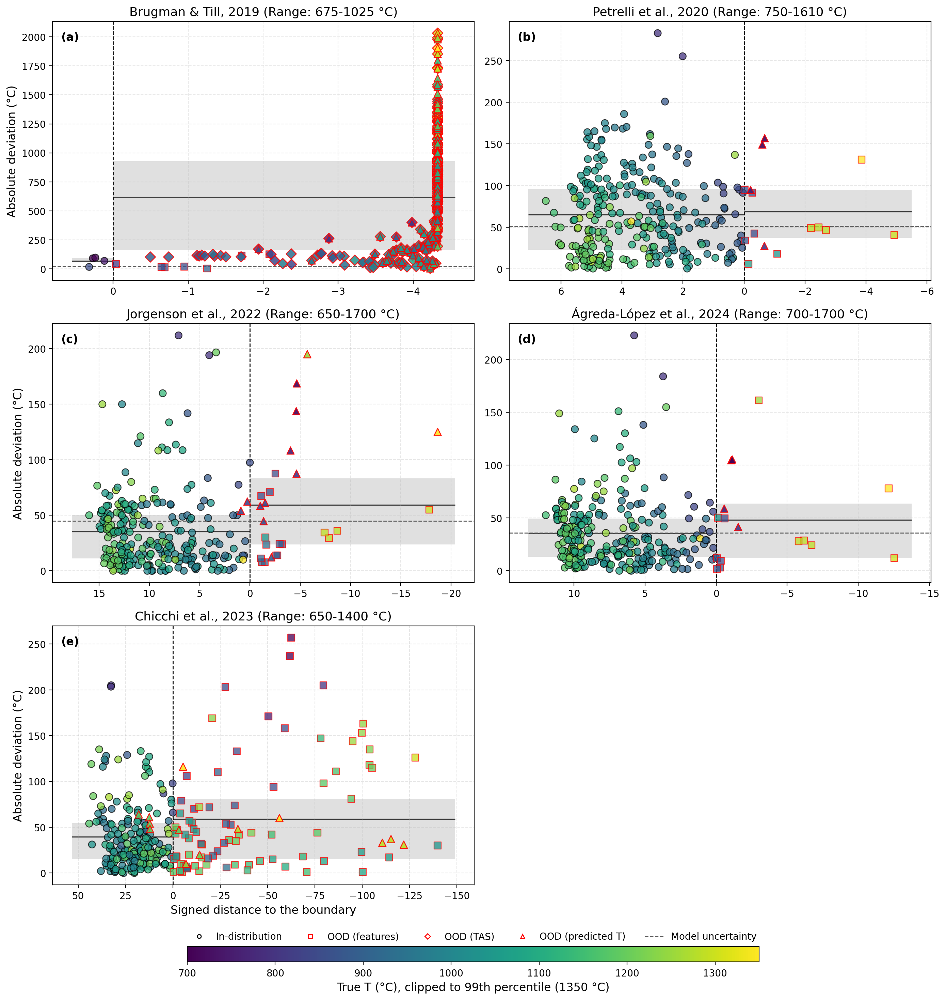

In [ ]:
T_cpx_liq = [
    m for m in T_model_pool
    if not m.cpx_only
]


fig, axes = plot_ood_panels_generic(
    T_cpx_liq,
    test_cpx,
    test_meta,
    test_liq=test_liq,
    petrological_ood_marker=True,
    T_P_ood_marker=True,
    ncols=2,
    fig_width=14,
    row_height=5.4,
    height_scale=1.08,
    cmap_name="viridis",
    norm_min=700,          # typical temperature range start
    clip_to_p99=False,
    cbar_width=0.6,
    cbar_height=0.013,
    cbar_y=0.15,
    legend_anchor_y=0.16,
    tight_bottom=0.18,
    tight_top=0.96,
)
plt.show()
fig.savefig(IMAGES_DIR / "fig_ood_T_cpx_liq.png",    dpi=300,
    bbox_inches="tight",
    pad_inches=0.02,
)

## TAS ood 

c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-pa

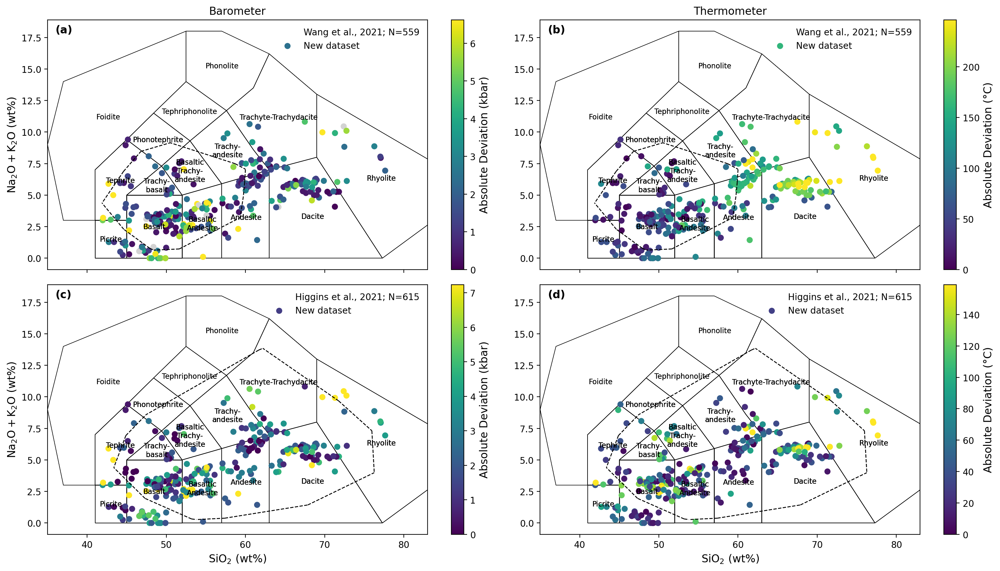

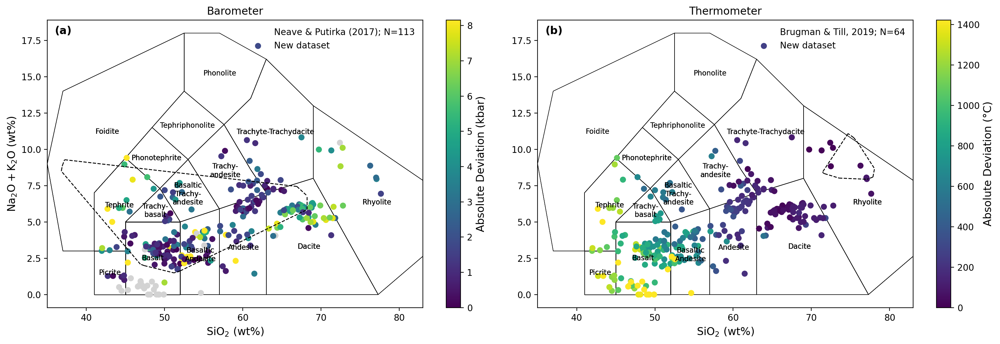

In [14]:
from paper.scripts.figure_helpers import (
    _add_panel_labels__nb03_c16 as _add_panel_labels,
    _clean_model_label_keep_year__nb03_c16 as _clean_model_label_keep_year,
    plot_tas_with_deviation_cbar__nb03_c16 as plot_tas_with_deviation_cbar,
)

import numpy as np
import matplotlib.pyplot as plt


from aims4pt.visualization.composition_plot import plot_glass_TAS_diagram



# ---- Pressure models
Wang_col_P = "Wang et al., 2021 (cpx_only)"
Higgins_col_P = "Higgins et al., 2021 (cpx_only)"
Neave_col_P = "Neave & Putirka, 2017 Pu08_eq33_T; eq1_P (cpx_liq) (cpx_liq)"

Wang_model_P = P_model_dict[Wang_col_P]
Higgins_model_P = P_model_dict[Higgins_col_P]
Neave_model_P = P_model_dict[Neave_col_P]

Wang_dev_P = np.abs(Wang_model_P.predict(cpx_unseen, liq_unseen) - meta_unseen[P_col])
Higgins_dev_P = np.abs(Higgins_model_P.predict(cpx_unseen) - meta_unseen[P_col])
Neave_dev_P = np.abs(Neave_model_P.predict(cpx_unseen, liq_unseen) - meta_unseen[P_col])

# ---- Temperature models
Wang_col_T = "Wang et al., 2021 (cpx_only)"
Higgins_col_T = "Higgins et al., 2021 (cpx_only)"
Brugman_col_T = "Brugman & Till, 2019 (cpx_liq)"

Wang_model_T = T_model_dict[Wang_col_T]
Higgins_model_T = T_model_dict[Higgins_col_T]
Brugman_model_T = T_model_dict[Brugman_col_T]

Wang_dev_T = np.abs(Wang_model_T.predict(cpx_unseen, liq_unseen) - meta_unseen[T_col])
Higgins_dev_T = np.abs(Higgins_model_T.predict(cpx_unseen, liq_unseen) - meta_unseen[T_col])
Brugman_dev_T = np.abs(Brugman_model_T.predict(cpx_unseen, liq_unseen) - meta_unseen[T_col])


# ============================================================
# Figure 1: 2x2 (wider)
#   [0,0] Wang P | [0,1] Wang T
#   [1,0] Higgins P | [1,1] Higgins T
# ============================================================

fig1, axes1 = plt.subplots(2, 2, figsize=(16, 9), dpi=200)  # ✅ wider

# ---- first row titles
axes1[0, 0].set_title("Barometer")
axes1[0, 1].set_title("Thermometer")

plot_tas_with_deviation_cbar(
    fig=fig1, ax=axes1[0, 0],
    model=Wang_model_P, model_label=Wang_col_P,
    X_liq_test=liq_unseen, deviation=Wang_dev_P,
    q=0.95, draw_convex_hull=True,
    colorbar_label="Absolute Deviation (kbar)",
)

plot_tas_with_deviation_cbar(
    fig=fig1, ax=axes1[0, 1],
    model=Wang_model_T, model_label=Wang_col_T,
    X_liq_test=liq_unseen, deviation=Wang_dev_T,
    q=0.95, draw_convex_hull=True,
    colorbar_label="Absolute Deviation (°C)",
)

plot_tas_with_deviation_cbar(
    fig=fig1, ax=axes1[1, 0],
    model=Higgins_model_P, model_label=Higgins_col_P,
    X_liq_test=liq_unseen, deviation=Higgins_dev_P,
    q=0.95, draw_convex_hull=True,
    colorbar_label="Absolute Deviation (kbar)",
)

plot_tas_with_deviation_cbar(
    fig=fig1, ax=axes1[1, 1],
    model=Higgins_model_T, model_label=Higgins_col_T,
    X_liq_test=liq_unseen, deviation=Higgins_dev_T,
    q=0.95, draw_convex_hull=True,
    colorbar_label="Absolute Deviation (°C)",
)

# ---- (3) remove y-axis label on right column
for ax in (axes1[0, 1], axes1[1, 1]):
    ax.set_ylabel("")

# ---- (4) keep x-axis labels only on last row
for ax in (axes1[0, 0], axes1[0, 1]):
    ax.set_xlabel("")
    ax.tick_params(labelbottom=False)

# ---- add panel labels (a)-(d)
_add_panel_labels(axes1, ["(a)", "(b)", "(c)", "(d)"])

fig1.tight_layout()
plt.show()
# save
fig1.savefig(IMAGES_DIR / "fig_tas_ood_cpx_only.png", dpi=300)

# ============================================================
# Figure 2: 1x2 (wider)
#   left: Neave P | right: Brugman T
# ============================================================

fig2, axes2 = plt.subplots(1, 2, figsize=(16, 5.5), dpi=200)  # ✅ wider
axes2[0].set_title("Barometer")
axes2[1].set_title("Thermometer")

plot_tas_with_deviation_cbar(
    fig=fig2, ax=axes2[0],
    model=Neave_model_P, model_label=Neave_col_P,   # ✅ label cleaned inside func
    X_liq_test=liq_unseen, deviation=Neave_dev_P,
    q=0.95, draw_convex_hull=True,
    colorbar_label="Absolute Deviation (kbar)",
)

plot_tas_with_deviation_cbar(
    fig=fig2, ax=axes2[1],
    model=Brugman_model_T, model_label=Brugman_col_T,
    X_liq_test=liq_unseen, deviation=Brugman_dev_T,
    q=0.95, draw_convex_hull=True,
    colorbar_label="Absolute Deviation (°C)",
)

# ---- (3) remove y-axis label on right panel
axes2[1].set_ylabel("")

# ---- add panel labels (a)-(b) for figure 2
_add_panel_labels(axes2, ["(a)", "(b)"])

fig2.tight_layout()
plt.show()
fig2.savefig(IMAGES_DIR / "fig_tas_ood_cpx_liq.png", dpi=300)


## Result comparison figures

### Pressure model

In [15]:
from aims4pt.model_tools.CpxTBSelect import workflow_thermobarometry
test_cpx = cpx_unseen.loc[testing_unseen_id].copy()
test_liq = liq_unseen.loc[testing_unseen_id].copy()
test_meta = meta_unseen.loc[testing_unseen_id].copy()
test_meta.rename(columns={P_col: "P_kbar", T_col: "T_C"}, inplace=True)

P_cpx_only_pool = [model for model in P_model_pool if model.cpx_only]
P_cpx_liq_pool = [model for model in P_model_pool if not model.cpx_only]
len_only, len_liq = len(P_cpx_only_pool), len(P_cpx_liq_pool)

df_path = CACHE_DIR / "predicted_P_unseen_testing_set.csv"

if df_path.exists():
    predicted_P_df = pd.read_csv(df_path, index_col=0)
else:
    workflow_P_only_model = workflow_thermobarometry(P_cpx_only_pool)
    workflow_P_only = workflow_P_only_model.predict(test_cpx, test_liq)

    workflow_P_liq_model = workflow_thermobarometry(P_cpx_liq_pool)
    workflow_P_liq = workflow_P_liq_model.predict(test_cpx, test_liq)


    P_model_selection_only = workflow_P_only_model.get_best_model_series()
    P_model_selection_liq = workflow_P_liq_model.get_best_model_series()
    predicted_P_df = pd.DataFrame({ 
        "workflow_P_cpx_only": workflow_P_only,
        "best_model_P_cpx_only": P_model_selection_only,
        "workflow_P_cpx_liq": workflow_P_liq,
        "best_model_P_cpx_liq": P_model_selection_liq,
    })
    for model_name in  P_model_names:
        model = next((m for m in P_model_pool if m.model_name == model_name), None)
        if model is None:
            continue
        y_pred = model.predict(test_cpx, test_liq)
        predicted_P_df[model_name] = y_pred

    # store predicted P dataframe
    predicted_P_df.to_csv(df_path, index=True)

P_real = test_meta["P_kbar"].copy()

c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-pack

c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-pack

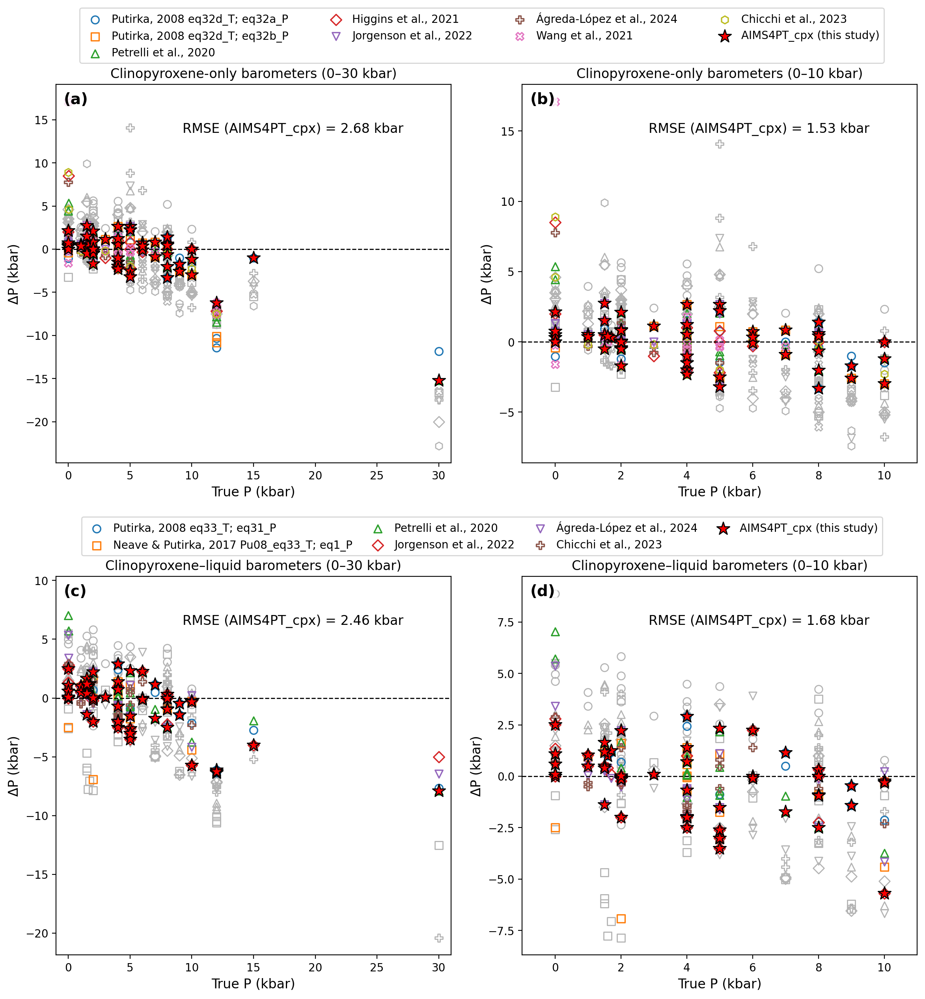

In [16]:
from paper.scripts.figure_helpers import (
    _add_panel_label__nb03_c20 as _add_panel_label,
    _dedupe_handles_labels__nb03_c20 as _dedupe_handles_labels,
    plot_pressure_residual_panel__nb03_c20 as plot_pressure_residual_panel,
)

import matplotlib.pyplot as plt




# ============================================================
# Main plotting (2x2) with ONE legend per row + safe spacing
# ============================================================

fig, axes = plt.subplots(2, 2, figsize=(12, 12), dpi=200, constrained_layout=False)

P_cpx_only_pool = [m for m in P_model_pool if m.cpx_only]
P_cpx_only_cols = [m.model_name for m in P_cpx_only_pool]

P_cpx_liq_pool = [m for m in P_model_pool if not m.cpx_only]
P_cpx_liq_cols = [m.model_name for m in P_cpx_liq_pool]

# ----------------------------
# Row 0: cpx-only
# ----------------------------
axes[0, 0], (h00, l00) = plot_pressure_residual_panel(
    P_real, predicted_P_df,
    model_cols=P_cpx_only_cols,
    workflow_col="workflow_P_cpx_only",
    P_min=0, P_max=30,
    ax=axes[0, 0],
    title="Clinopyroxene-only barometers (0–30 kbar)",
)

axes[0, 1], (h01, l01) = plot_pressure_residual_panel(
    P_real, predicted_P_df,
    model_cols=P_cpx_only_cols,
    workflow_col="workflow_P_cpx_only",
    P_min=0, P_max=10,
    ax=axes[0, 1],
    title="Clinopyroxene-only barometers (0–10 kbar)",
)

h0, l0 = _dedupe_handles_labels(h00 + h01, l00 + l01)

# ----------------------------
# Row 1: cpx-liq
# ----------------------------
axes[1, 0], (h10, l10) = plot_pressure_residual_panel(
    P_real, predicted_P_df,
    model_cols=P_cpx_liq_cols,
    workflow_col="workflow_P_cpx_liq",
    P_min=0, P_max=30,
    ax=axes[1, 0],
    title="Clinopyroxene–liquid barometers (0–30 kbar)",
)

axes[1, 1], (h11, l11) = plot_pressure_residual_panel(
    P_real, predicted_P_df,
    model_cols=P_cpx_liq_cols,
    workflow_col="workflow_P_cpx_liq",
    P_min=0, P_max=10,
    ax=axes[1, 1],
    title="Clinopyroxene–liquid barometers (0–10 kbar)",
)

h1, l1 = _dedupe_handles_labels(h10 + h11, l10 + l11)

# ----------------------------
# Panel labels
# ----------------------------
_add_panel_label(axes[0, 0], "(a)")
_add_panel_label(axes[0, 1], "(b)")
_add_panel_label(axes[1, 0], "(c)")
_add_panel_label(axes[1, 1], "(d)")

# ----------------------------
# Leave space for row legends
# ----------------------------
fig.subplots_adjust(
    left=0.07, right=0.98,
    bottom=0.06,
    top=0.98,
    wspace=0.18,
    hspace=0.30,
)

# ----------------------------
# Row legends
# ----------------------------
fig.legend(
    h0, l0,
    loc="upper center",
    bbox_to_anchor=(0.52, 1.067),
    ncol=4,
    frameon=True,
    fontsize=10,
    handletextpad=0.5,
    columnspacing=3,
)

fig.legend(
    h1, l1,
    loc="upper center",
    bbox_to_anchor=(0.52, 0.529),
    ncol=4,
    frameon=True,
    fontsize=10,
    handletextpad=0.5,
    columnspacing=1.0,
)

plt.show()

fig.savefig(
    IMAGES_DIR / "fig7_results_P_10kbar.png",
    dpi=300,
    bbox_inches="tight",
)


### Temperature model

In [17]:

df_path = CACHE_DIR / "predicted_T_unseen_testing_set.csv"
test_cpx = cpx_unseen.loc[testing_unseen_id].copy()
test_liq = liq_unseen.loc[testing_unseen_id].copy()
test_meta = meta_unseen.loc[testing_unseen_id].copy()
test_meta.rename(columns={P_col: "P_kbar", T_col: "T_C"}, inplace=True)

T_cpx_only_pool = [model for model in T_model_pool if model.cpx_only]
T_cpx_liq_pool = [model for model in T_model_pool if not model.cpx_only]
len_only, len_liq = len(T_cpx_only_pool), len(T_cpx_liq_pool)

if df_path.exists():
    predicted_T_df = pd.read_csv(df_path, index_col=0)
else:
    workflow_T_only_model = workflow_thermobarometry(T_cpx_only_pool)
    workflow_T_only = workflow_T_only_model.predict(test_cpx, test_liq)

    T_model_selection_only = workflow_T_only_model.get_best_model_series()
    workflow_T_liq_model = workflow_thermobarometry(T_cpx_liq_pool)
    workflow_T_liq = workflow_T_liq_model.predict(test_cpx, test_liq)
    T_model_selection_liq = workflow_T_liq_model.get_best_model_series()
    predicted_T_df = pd.DataFrame({ 
        "workflow_T_cpx_only": workflow_T_only,
        "best_model_T_cpx_only": T_model_selection_only,
        "workflow_T_cpx_liq": workflow_T_liq,
        "best_model_T_cpx_liq": T_model_selection_liq,
    })

    for model_name in T_model_names:
        model = next((m for m in T_model_pool if m.model_name == model_name), None)
        if model is None:
            continue
        y_pred = model.predict(test_cpx, test_liq)
        predicted_T_df[model_name] = y_pred


    predicted_T_df.to_csv(df_path)
T_real = test_meta["T_C"].copy()

c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-pack

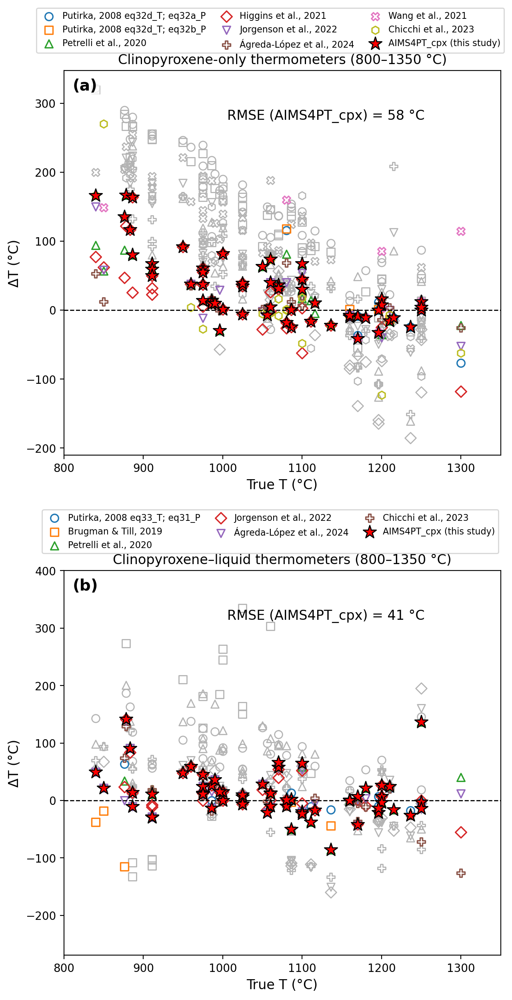

In [18]:
from paper.scripts.figure_helpers import (
    _add_panel_label__nb03_c23 as _add_panel_label,
    _dedupe_handles_labels__nb03_c23 as _dedupe_handles_labels,
    plot_temperature_residual_panel__nb03_c23 as plot_temperature_residual_panel,
)

from collections import OrderedDict
import matplotlib.pyplot as plt









# ============================================================
# Main plotting (2x2) with ONE legend per row + safe spacing
# ============================================================

fig, axes = plt.subplots(2, 1, figsize=(6, 12), dpi=200, constrained_layout=False)

# ---- pools (adjust these filters if your model objects use different flags) ----
T_cpx_only_pool = [m for m in T_model_pool if getattr(m, "cpx_only", False)]
T_cpx_only_cols = [m.model_name for m in T_cpx_only_pool]

T_cpx_liq_pool = [m for m in T_model_pool if not getattr(m, "cpx_only", False)]
T_cpx_liq_cols = [m.model_name for m in T_cpx_liq_pool]

# ----------------------------
# Row 0: cpx-only
# ----------------------------
axes[0], (h0, l0) = plot_temperature_residual_panel(
    T_real, predicted_T_df,
    model_cols=T_cpx_only_cols,
    workflow_col="workflow_T_cpx_only",
    T_min=800, T_max=1350,
    ax=axes[0],
    title="Clinopyroxene-only thermometers (800–1350 °C)",
)


# ----------------------------
# Row 1: cpx-liq
# ----------------------------

axes[1], (h1, l1) = plot_temperature_residual_panel(
    T_real, predicted_T_df,
    model_cols=T_cpx_liq_cols,
    workflow_col="workflow_T_cpx_liq",
    T_min=800, T_max=1350,
    ax=axes[1],
    title="Clinopyroxene–liquid thermometers (800–1350 °C)",
    limit_y=True,
)


# ----------------------------
# Panel labels
# ----------------------------
_add_panel_label(axes[0], "(a)")
_add_panel_label(axes[1], "(b)")


# ----------------------------
# Layout spacing for legends
# ----------------------------
fig.subplots_adjust(
    left=0.07, right=0.98,
    bottom=0.06,
    top=0.98,
    wspace=0.18,
    hspace=0.30,
)

# ----------------------------
# Row legends (one per row)
# ----------------------------
fig.legend(
    h0, l0,
    loc="upper center",
    bbox_to_anchor=(0.5, 1.05),
    ncol=3,
    frameon=True,
    fontsize=8,
    handletextpad=0.5,
    columnspacing=1,
)

fig.legend(
    h1, l1,
    loc="upper center",
    bbox_to_anchor=(0.5, 0.528),
    ncol=3,
    frameon=True,
    fontsize=8,
    handletextpad=0.5,
    columnspacing=1.0,
)

plt.show()

fig.savefig(
    IMAGES_DIR / "fig8_results_T.png",
    dpi=300,
    bbox_inches="tight",
)


Note that the y-axis range in panel (b) is extended to accommodate severe low-temperature overestimation by one clinopyroxene–liquid thermometer; this scaling prevents compression of residuals from other models.

## Slope and result comparison figures

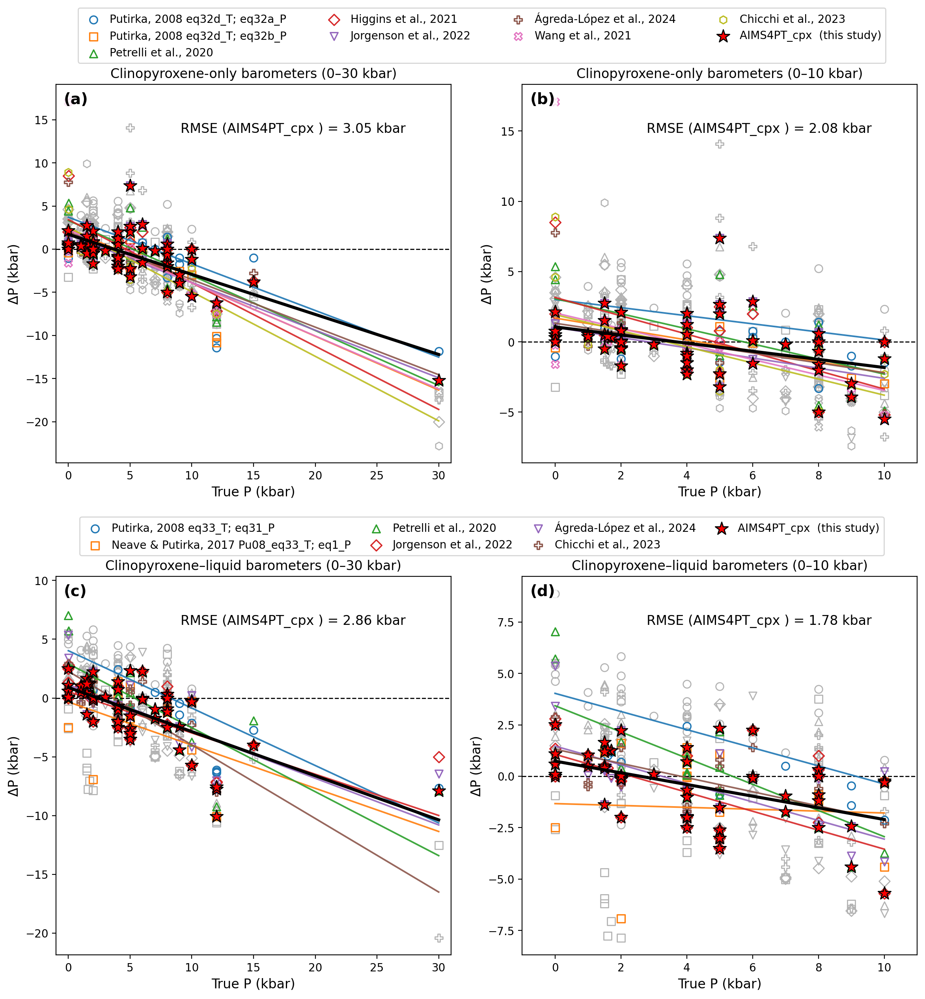

,model_name,slope,intercept,n_points,panel
0,"Putirka, 2008 eq32d_T; eq32a_P",-0.540769,3.703609,58,cpx_only_0_30_kbar
1,"Putirka, 2008 eq32d_T; eq32b_P",-0.624230,2.393886,53,cpx_only_0_30_kbar
2,"Petrelli et al., 2020",-0.637613,3.323100,59,cpx_only_0_30_kbar
3,"Higgins et al., 2021",-0.733611,3.424852,59,cpx_only_0_30_kbar
4,"Jorgenson et al., 2022",-0.552921,1.666035,59,cpx_only_0_30_kbar
5,"Ágreda-López et al., 2024",-0.551679,1.992435,59,cpx_only_0_30_kbar
6,"Wang et al., 2021",-0.615173,2.240479,58,cpx_only_0_30_kbar
7,"Chicchi et al., 2023",-0.748578,2.547856,59,cpx_only_0_30_kbar
8,AIMS4PT_cpx (this study),-0.464277,1.718011,55,cpx_only_0_30_kbar
9,"Putirka, 2008 eq32d_T; eq32a_P",-0.288401,3.012752,53,cpx_only_0_10_kbar


In [27]:
from paper.scripts.figure_helpers import (
    _add_panel_label__nb03_c27 as _add_panel_label,
    _calc_regression_fit__nb03_c27 as _calc_regression_fit,
    _dedupe_handles_labels__nb03_c27 as _dedupe_handles_labels,
    plot_pressure_residual_panel__nb03_c27 as plot_pressure_residual_panel,
)

from collections import OrderedDict
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score









# ============================================================
# Main plotting (2x2) with ONE legend per row + safe spacing
# ============================================================

fig, axes = plt.subplots(2, 2, figsize=(12, 12), dpi=200, constrained_layout=False)

P_cpx_only_pool = [m for m in P_model_pool if m.cpx_only]
P_cpx_only_cols = [m.model_name for m in P_cpx_only_pool]

P_cpx_liq_pool = [m for m in P_model_pool if not m.cpx_only]
P_cpx_liq_cols = [m.model_name for m in P_cpx_liq_pool]

# ----------------------------
# Row 0: cpx-only
# ----------------------------
axes[0, 0], (h00, l00), slopes_00 = plot_pressure_residual_panel(
    P_real, predicted_P_df,
    model_cols=P_cpx_only_cols,
    workflow_col="workflow_P_cpx_only",
    P_min=0, P_max=30,
    ax=axes[0, 0],
    title="Clinopyroxene-only barometers (0–30 kbar)",
)

axes[0, 1], (h01, l01), slopes_01 = plot_pressure_residual_panel(
    P_real, predicted_P_df,
    model_cols=P_cpx_only_cols,
    workflow_col="workflow_P_cpx_only",
    P_min=0, P_max=10,
    ax=axes[0, 1],
    title="Clinopyroxene-only barometers (0–10 kbar)",
)

h0, l0 = _dedupe_handles_labels(h00 + h01, l00 + l01)

# ----------------------------
# Row 1: cpx-liq
# ----------------------------
axes[1, 0], (h10, l10), slopes_10 = plot_pressure_residual_panel(
    P_real, predicted_P_df,
    model_cols=P_cpx_liq_cols,
    workflow_col="workflow_P_cpx_liq",
    P_min=0, P_max=30,
    ax=axes[1, 0],
    title="Clinopyroxene–liquid barometers (0–30 kbar)",
)

axes[1, 1], (h11, l11), slopes_11 = plot_pressure_residual_panel(
    P_real, predicted_P_df,
    model_cols=P_cpx_liq_cols,
    workflow_col="workflow_P_cpx_liq",
    P_min=0, P_max=10,
    ax=axes[1, 1],
    title="Clinopyroxene–liquid barometers (0–10 kbar)",
)

h1, l1 = _dedupe_handles_labels(h10 + h11, l10 + l11)

# ----------------------------
# Panel labels
# ----------------------------
_add_panel_label(axes[0, 0], "(a)")
_add_panel_label(axes[0, 1], "(b)")
_add_panel_label(axes[1, 0], "(c)")
_add_panel_label(axes[1, 1], "(d)")

# ----------------------------
# Leave space for row legends
# ----------------------------
fig.subplots_adjust(
    left=0.07, right=0.98,
    bottom=0.06,
    top=0.98,
    wspace=0.18,
    hspace=0.30,
)

# ----------------------------
# Row legends
# ----------------------------
fig.legend(
    h0, l0,
    loc="upper center",
    bbox_to_anchor=(0.52, 1.067),
    ncol=4,
    frameon=True,
    fontsize=10,
    handletextpad=0.5,
    columnspacing=3,
)

fig.legend(
    h1, l1,
    loc="upper center",
    bbox_to_anchor=(0.52, 0.529),
    ncol=4,
    frameon=True,
    fontsize=10,
    handletextpad=0.5,
    columnspacing=1.0,
)

pressure_slope_summary = pd.concat(
    [
        slopes_00.assign(panel="cpx_only_0_30_kbar"),
        slopes_01.assign(panel="cpx_only_0_10_kbar"),
        slopes_10.assign(panel="cpx_liq_0_30_kbar"),
        slopes_11.assign(panel="cpx_liq_0_10_kbar"),
    ],
    ignore_index=True,
)
cache_dir = Path('.cache')
cache_dir.mkdir(parents=True, exist_ok=True)
pressure_slope_summary.to_csv(cache_dir / 'pressure_regression_slopes.csv', index=False)

plt.show()
display(pressure_slope_summary)

fig.savefig(
    IMAGES_DIR / "fig_results_P_v1_regression_line.png",
    dpi=300,
    bbox_inches="tight",
)

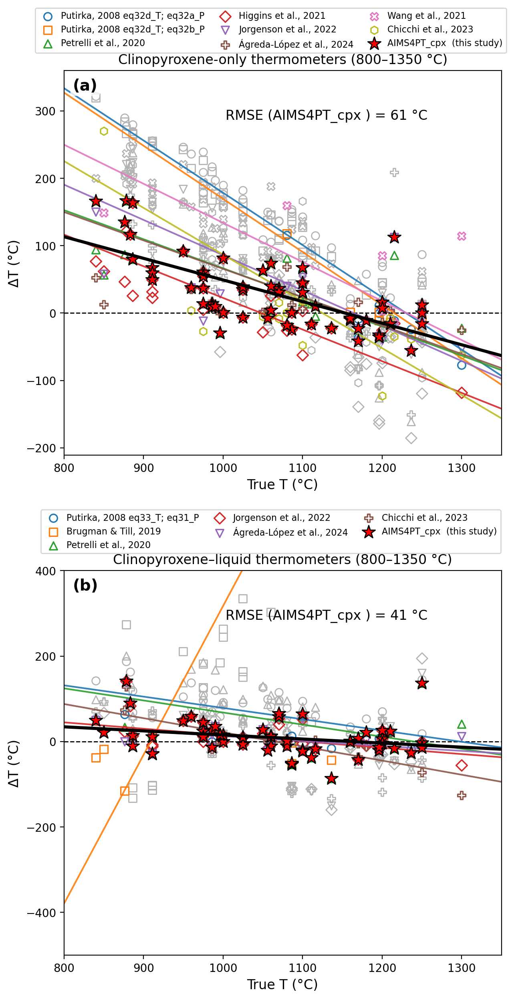

,model_name,slope,intercept,n_points,panel
0,"Putirka, 2008 eq32d_T; eq32a_P",-0.776257,954.877123,58,cpx_only_800_1350_C
1,"Putirka, 2008 eq32d_T; eq32b_P",-0.788684,958.302051,53,cpx_only_800_1350_C
2,"Petrelli et al., 2020",-0.431871,498.331299,59,cpx_only_800_1350_C
3,"Higgins et al., 2021",-0.469947,492.499277,59,cpx_only_800_1350_C
4,"Jorgenson et al., 2022",-0.523416,609.414488,59,cpx_only_800_1350_C
5,"Ágreda-López et al., 2024",-0.421337,487.112711,59,cpx_only_800_1350_C
6,"Wang et al., 2021",-0.580104,714.089094,59,cpx_only_800_1350_C
7,"Chicchi et al., 2023",-0.694335,781.128693,59,cpx_only_800_1350_C
8,AIMS4PT_cpx (this study),-0.320830,370.029096,55,cpx_only_800_1350_C
9,"Putirka, 2008 eq33_T; eq31_P",-0.264274,343.014287,53,cpx_liq_800_1350_C


In [28]:
from paper.scripts.figure_helpers import (
    _add_panel_label__nb03_c29 as _add_panel_label,
    _calc_regression_fit__nb03_c29 as _calc_regression_fit,
    _dedupe_handles_labels__nb03_c29 as _dedupe_handles_labels,
    plot_temperature_residual_panel__nb03_c29 as plot_temperature_residual_panel,
)

from collections import OrderedDict
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score











# ============================================================
# Main plotting (2x2) with ONE legend per row + safe spacing
# ============================================================

fig, axes = plt.subplots(2, 1, figsize=(6, 12), dpi=200, constrained_layout=False)

# ---- pools (adjust these filters if your model objects use different flags) ----
T_cpx_only_pool = [m for m in T_model_pool if getattr(m, "cpx_only", False)]
T_cpx_only_cols = [m.model_name for m in T_cpx_only_pool]

T_cpx_liq_pool = [m for m in T_model_pool if not getattr(m, "cpx_only", False)]
T_cpx_liq_cols = [m.model_name for m in T_cpx_liq_pool]

# ----------------------------
# Row 0: cpx-only
# ----------------------------
axes[0], (h0, l0), slopes_0 = plot_temperature_residual_panel(
    T_real, predicted_T_df,
    model_cols=T_cpx_only_cols,
    workflow_col="workflow_T_cpx_only",
    T_min=800, T_max=1350,
    ax=axes[0],
    title="Clinopyroxene-only thermometers (800–1350 °C)",
)


# ----------------------------
# Row 1: cpx-liq
# ----------------------------

axes[1], (h1, l1), slopes_1 = plot_temperature_residual_panel(
    T_real, predicted_T_df,
    model_cols=T_cpx_liq_cols,
    workflow_col="workflow_T_cpx_liq",
    T_min=800, T_max=1350,
    ax=axes[1],
    title="Clinopyroxene–liquid thermometers (800–1350 °C)",
    limit_y=True,
)


# ----------------------------
# Panel labels
# ----------------------------
_add_panel_label(axes[0], "(a)")
_add_panel_label(axes[1], "(b)")


# ----------------------------
# Layout spacing for legends
# ----------------------------
fig.subplots_adjust(
    left=0.07, right=0.98,
    bottom=0.06,
    top=0.98,
    wspace=0.18,
    hspace=0.30,
)

# ----------------------------
# Row legends (one per row)
# ----------------------------
fig.legend(
    h0, l0,
    loc="upper center",
    bbox_to_anchor=(0.5, 1.05),
    ncol=3,
    frameon=True,
    fontsize=8,
    handletextpad=0.5,
    columnspacing=1,
)

fig.legend(
    h1, l1,
    loc="upper center",
    bbox_to_anchor=(0.5, 0.528),
    ncol=3,
    frameon=True,
    fontsize=8,
    handletextpad=0.5,
    columnspacing=1.0,
)

temperature_slope_summary = pd.concat(
    [
        slopes_0.assign(panel="cpx_only_800_1350_C"),
        slopes_1.assign(panel="cpx_liq_800_1350_C"),
    ],
    ignore_index=True,
)
cache_dir = Path('.cache')
cache_dir.mkdir(parents=True, exist_ok=True)
temperature_slope_summary.to_csv(cache_dir / 'temperature_regression_slopes.csv', index=False)

plt.show()
display(temperature_slope_summary)

fig.savefig(
    IMAGES_DIR / "fig_results_T_v1_regression_line.png",
    dpi=300,
    bbox_inches="tight",
)
